<a href="https://colab.research.google.com/github/tettey-exploits/cyclegan/blob/main/CycleGAN_Unpaired_Image_to_image_Translation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CycleGAN for Image-to-Image Translation

## Introduction
In this notebook, we implement a generative model based on the paper [*Unpaired Image-to-Image Translation
using Cycle-Consistent Adversarial Networks*](https://arxiv.org/abs/1703.10593) by Zhu et al. 2017, commonly referred to as CycleGAN. CycleGAN (Cycle-Consistent Generative Adversarial Network) is a deep learning model used for unpaired image-to-image translation. Unlike traditional models that require paired examples (e.g., Pix2Pix), CycleGAN learns to translate between two domains without one-to-one image pairs.

### Key Concepts
- **Unpaired Image Translation**: Translates images from one domain (e.g., summer) to another domain (e.g., winter) without needing paired samples.
- **Cycle Consistency**: The model enforces that translating an image from one domain to the other and back should result in the original image. This helps maintain important details in the translated image.

### Use Cases
- Artistic style transfer (e.g., photo to painting).
- Season transformation (e.g., summer to winter landscapes).
- Object transfiguration (e.g., horse to zebra).

### Notebook Overview
This notebook demonstrates the following:
1. Loading and preprocessing an unpaired image dataset.
2. Building the CycleGAN model, including both the **Generator** and **Discriminator** networks.
3. Implementing custom loss functions: adversarial loss, cycle consistency loss, and identity loss.
4. Training the model on an unpaired dataset.
5. Generating and visualizing translated images.

We will be training a model that can convert horses into zebras, and vice versa.


##  Setup and Imports

##### Download 'horse2zebra' dataset

In [1]:
import gdown

#download dataset
gdown.download("https://drive.google.com/file/d/1ztrJLSdjnEZgsM-NQfi1dhWgDhd9Zs_s/view?usp=sharing", "horse2zebra.zip", quiet=False, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=1ztrJLSdjnEZgsM-NQfi1dhWgDhd9Zs_s
From (redirected): https://drive.google.com/uc?id=1ztrJLSdjnEZgsM-NQfi1dhWgDhd9Zs_s&confirm=t&uuid=64407c4f-45de-42aa-ac55-a26145e715d1
To: /content/horse2zebra.zip
100%|██████████| 117M/117M [00:04<00:00, 28.0MB/s]


'horse2zebra.zip'

##### Unzip dataset

In [2]:
import zipfile

# Unzip the downloaded file
zip_ref = zipfile.ZipFile("/content/horse2zebra.zip")
zip_ref.extractall()
zip_ref.close()

In [3]:
# import libraries
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import glob
import random
import os
from torch.utils.data import Dataset
from PIL import Image

### Helper Functions for Image Processing

This functions provide essential utilities for visualizing image tensors.

In [4]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

### ImageDataset CycleGAN
This ImageDataset class is designed to handle unpaired image datasets for CycleGAN. It loads images from two domains, A and B, applies transformations, and pairs them randomly to generate training samples.

In [5]:
# Inspired by https://github.com/aitorzip/PyTorch-CycleGAN/blob/master/datasets.py
class ImageDataset(Dataset):
    def __init__(self, root, transform=None, mode='train'):
        self.transform = transform
        self.files_A = sorted(glob.glob(os.path.join(root, '%sA' % mode) + '/*.*'))
        self.files_B = sorted(glob.glob(os.path.join(root, '%sB' % mode) + '/*.*'))
        if len(self.files_A) > len(self.files_B):
            self.files_A, self.files_B = self.files_B, self.files_A
        self.new_perm()
        assert len(self.files_A) > 0, "Make sure you downloaded the horse2zebra images!"

    def new_perm(self):
        self.randperm = torch.randperm(len(self.files_B))[:len(self.files_A)]

    def __getitem__(self, index):
        item_A = self.transform(Image.open(self.files_A[index % len(self.files_A)]))
        item_B = self.transform(Image.open(self.files_B[self.randperm[index]]))
        if item_A.shape[0] != 3:
            item_A = item_A.repeat(3, 1, 1)
        if item_B.shape[0] != 3:
            item_B = item_B.repeat(3, 1, 1)
        if index == len(self) - 1:
            self.new_perm()
        # Old versions of PyTorch didn't support normalization for different-channeled images
        return (item_A - 0.5) * 2, (item_B - 0.5) * 2

    def __len__(self):
        return min(len(self.files_A), len(self.files_B))

## The CycleGAN Architecture

### Generator
The code for a CycleGAN generator is much like Pix2Pix's U-Net with the addition of the residual block between the encoding (contracting) and decoding (expanding) blocks.

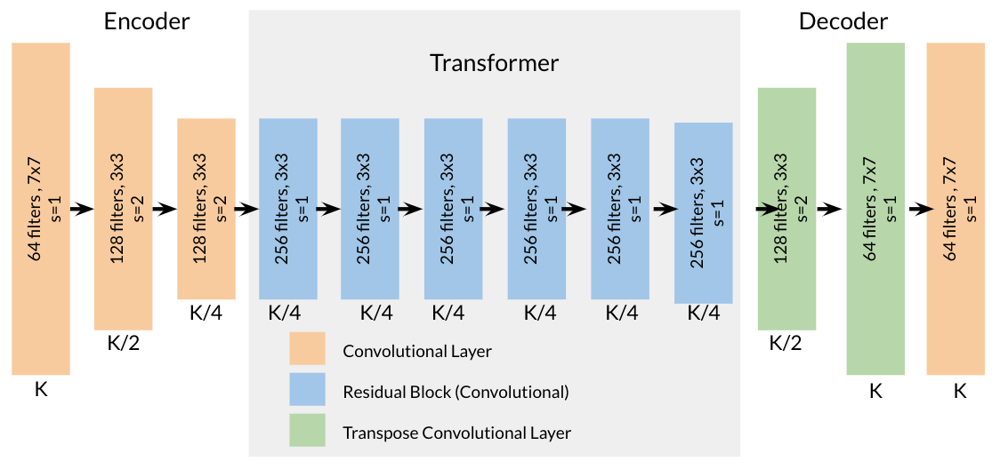)
*Diagram of a CycleGAN generator: composed of encoding blocks, residual blocks, and then decoding blocks.*

#### Residual Block
Perhaps the most notable architectural difference between the U-Net used for Pix2Pix and the architecture for CycleGAN are the residual blocks. In CycleGAN, after the expanding blocks, there are convolutional layers where the output is ultimately added to the original input so that the network can change as little as possible on the image. You can think of this transformation as a kind of skip connection, where instead of being concatenated as new channels before the convolution which combines them, it's added directly to the output of the convolution. In the visualization below, you can imagine the stripes being generated by the convolutions and then added to the original image of the horse to transform it into a zebra. These skip connections also allow the network to be deeper, because they help with vanishing gradients issues that come when a neural network gets too deep and the gradients multiply in backpropagation to become very small; instead, these skip connections enable more gradient flow. A deeper network is often able to learn more complex features.


![Residual block explanation: shows horse going through convolutions leading to stripes, added to the original horse image to get a zebra]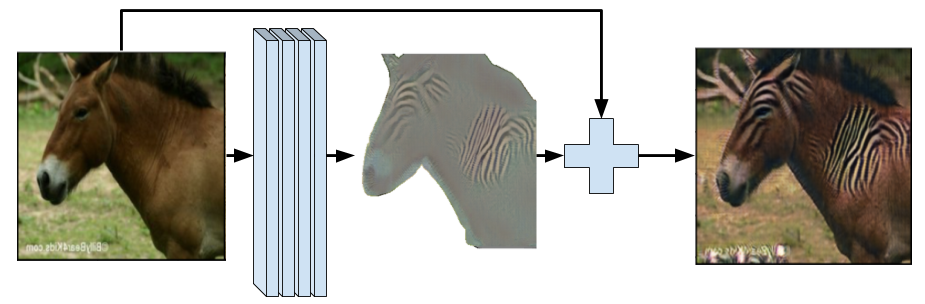

*Example of a residual block.*

In [6]:
class ResidualBlock(nn.Module):
    '''
    ResidualBlock Class:
    Performs two convolutions and an instance normalization, the input is added
    to this output to form the residual block output.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.instancenorm = nn.InstanceNorm2d(input_channels)
        self.activation = nn.ReLU()

    def forward(self, x):
        '''
        Function for completing a forward pass of ResidualBlock:
        Given an image tensor, completes a residual block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        original_x = x.clone()
        x = self.conv1(x)
        x = self.instancenorm(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.instancenorm(x)
        return original_x + x

#### Contracting and Expanding Blocks

`ContractingBlock` Class: Implements a convolutional block followed by a max-pooling operation. It optionally includes batch normalization for better convergence.

**Components**:

*   conv1: Convolution layer that reduces the spatial dimensions.
*   activation: ReLU or LeakyReLU activation function.
*   instancenorm: Optional instance normalization.

Takes an input tensor, applies convolution, normalization (if enabled), and activation, then returns the transformed tensor.

In [7]:
class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs a convolution followed by a max pool operation and an optional instance norm.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_bn=True, kernel_size=3, activation='relu'):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=kernel_size, padding=1, stride=2, padding_mode='reflect')
        self.activation = nn.ReLU() if activation == 'relu' else nn.LeakyReLU(0.2)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels * 2)
        self.use_bn = use_bn

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock:
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x

`ExpandingBlock` Class:
Implements a transposed convolution (also known as deconvolution) to upsample the input tensor. Optionally includes instance normalization.

**Components**:
*   conv1: Transposed convolution layer that increases the spatial dimensions.
*   activation: ReLU activation function.
*   instancenorm: Optional instance normalization.

Takes an input tensor, applies transposed convolution, normalization (if enabled), and activation, then returns the transformed tensor.

In [8]:
class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class:
    Performs a convolutional transpose operation in order to upsample,
        with an optional instance norm
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.conv1 = nn.ConvTranspose2d(input_channels, input_channels // 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()

    def forward(self, x):
        '''
        Function for completing a forward pass of ExpandingBlock:
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
            skip_con_x: the image tensor from the contracting path (from the opposing block of x)
                    for the skip connection
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x

`FeatureMapBlock` Class:
The final block in a generator that maps the input tensor to the desired number of output channels.

**Components**:
*   conv: A convolution layer that adjusts the channel size.

Takes an input tensor and maps it to the desired number of output channels, typically used for generating the final output of the model.
Each class is designed to handle specific transformations of image tensors.

In [9]:
class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a Generator -
    maps each the output to the desired number of output channels
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=7, padding=3, padding_mode='reflect')

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock:
        Given an image tensor, returns it mapped to the desired number of channels.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv(x)
        return x

#### CycleGAN Generator
Finally, we put all the blocks together to create our CycleGAN generator.

In [10]:
class Generator(nn.Module):
    '''
    Generator Class
    A series of 2 contracting blocks, 9 residual blocks, and 2 expanding blocks to
    transform an input image into an image from the other class, with an upfeature
    layer at the start and a downfeature layer at the end.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super(Generator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        res_mult = 4
        self.res0 = ResidualBlock(hidden_channels * res_mult)
        self.res1 = ResidualBlock(hidden_channels * res_mult)
        self.res2 = ResidualBlock(hidden_channels * res_mult)
        self.res3 = ResidualBlock(hidden_channels * res_mult)
        self.res4 = ResidualBlock(hidden_channels * res_mult)
        self.res5 = ResidualBlock(hidden_channels * res_mult)
        self.res6 = ResidualBlock(hidden_channels * res_mult)
        self.res7 = ResidualBlock(hidden_channels * res_mult)
        self.res8 = ResidualBlock(hidden_channels * res_mult)
        self.expand2 = ExpandingBlock(hidden_channels * 4)
        self.expand3 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.tanh = torch.nn.Tanh()

    def forward(self, x):
        '''
        Function for completing a forward pass of Generator:
        Given an image tensor, passes it through the U-Net with residual blocks
        and returns the output.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.res0(x2)
        x4 = self.res1(x3)
        x5 = self.res2(x4)
        x6 = self.res3(x5)
        x7 = self.res4(x6)
        x8 = self.res5(x7)
        x9 = self.res6(x8)
        x10 = self.res7(x9)
        x11 = self.res8(x10)
        x12 = self.expand2(x11)
        x13 = self.expand3(x12)
        xn = self.downfeature(x13)
        return self.tanh(xn)

### PatchGAN Discriminator

Next, we define the discriminator—a PatchGAN.

In [11]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake.
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=64):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False, kernel_size=4, activation='lrelu')
        self.contract2 = ContractingBlock(hidden_channels * 2, kernel_size=4, activation='lrelu')
        self.contract3 = ContractingBlock(hidden_channels * 4, kernel_size=4, activation='lrelu')
        self.final = nn.Conv2d(hidden_channels * 8, 1, kernel_size=1)

    def forward(self, x):
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        xn = self.final(x3)
        return xn

## CycleGAN Training


*   Define Hyperparameters
*   Define Image Transformations and Load Dataset
*   Initialize Generator and Discriminator Models, Optimizers, and Weight Initialization
*   Define Loss Functions
*   Model Training







### Define Hyperparameters

In [12]:
import torch.nn.functional as F

# Loss functions
adv_criterion = nn.MSELoss()  # Adversarial loss function (Mean Squared Error) for the discriminator
recon_criterion = nn.L1Loss()  # Reconstruction loss function (L1 loss) for the generator

# Training settings
n_epochs = 20  # Number of epochs to train the model
dim_A = 3  # Number of channels in the input image from domain A (e.g., 3 for RGB)
dim_B = 3  # Number of channels in the input image from domain B (e.g., 3 for RGB)

# Display settings
display_step = 200  # Number of iterations between displaying training progress

# Hyperparameters
batch_size = 1  # Batch size for training (here, using one image per batch)
lr = 0.0002  # Learning rate for the optimizer

# Image size settings
load_shape = 286  # Input image size before cropping or resizing
target_shape = 256  # Final image size for training (after resizing or cropping)

# Device configuration
device = 'cuda'  # Device to run the model on ('cuda' for GPU, 'cpu' for CPU)


### Define Image Transformations and Load Dataset

In [13]:
# Define a series of image transformations to apply during data loading
transform = transforms.Compose([  # Sequentially applies each transformation
    transforms.Resize(load_shape),  # Resize the image to the specified size (286x286)
    transforms.RandomCrop(target_shape),  # Randomly crop the image to the target size (256x256)
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally for data augmentation
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor (from PIL image or numpy array)
])

# Import the torchvision package (which includes datasets, models, and transformations)
import torchvision

# Initialize the custom ImageDataset with the path to the dataset and the transformation pipeline
dataset = ImageDataset("/content/Files/horse2zebra", transform=transform)  # Load the horse2zebra dataset

### Initialize Generator and Discriminator Models, Optimizers, and Weight Initialization

In [14]:
# Initialize the generator models for both directions (A to B and B to A)
gen_AB = Generator(dim_A, dim_B).to(device)  # Generator that converts images from domain A to domain B
gen_BA = Generator(dim_B, dim_A).to(device)  # Generator that converts images from domain B to domain A

# Optimizers for the generator models (Adam optimizer with learning rate and beta values)
gen_opt = torch.optim.Adam(
    list(gen_AB.parameters()) + list(gen_BA.parameters()),  # Combine parameters of both generators
    lr=lr,  # Learning rate for the optimizers
    betas=(0.5, 0.999)
)

# Initialize the discriminator models for both domains (A and B)
disc_A = Discriminator(dim_A).to(device)  # Discriminator for domain A (distinguishes real vs fake for domain A)
disc_B = Discriminator(dim_B).to(device)  # Discriminator for domain B (distinguishes real vs fake for domain B)

# Optimizers for the discriminator models (Adam optimizer with learning rate and beta values)
disc_A_opt = torch.optim.Adam(
    disc_A.parameters(),  # Parameters for the discriminator of domain A
    lr=lr,
    betas=(0.5, 0.999)
)

disc_B_opt = torch.optim.Adam(
    disc_B.parameters(),  # Parameters for the discriminator of domain B
    lr=lr,
    betas=(0.5, 0.999)
)


In [15]:
# Function to initialize weights for the network layers
def weights_init(m):
    # If the layer is a convolutional layer (Conv2d or ConvTranspose2d)
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)  # Initialize weights with normal distribution (mean=0, std=0.02)

    # If the layer is a batch normalization layer (BatchNorm2d)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)  # Initialize batch normalization weights
        torch.nn.init.constant_(m.bias, 0)  # Initialize batch normalization bias to 0

In [16]:
# Flag to determine if pretrained weights should be loaded
pretrained = False

# If pretrained is set to True, load the pretrained model weights
if pretrained:
    # Load the pretrained weights from a checkpoint file
    pre_dict = torch.load('cycleGAN_100000.pth')

    # Load the weights into the corresponding model components
    gen_AB.load_state_dict(pre_dict['gen_AB'])  # Generator A to B weights
    gen_BA.load_state_dict(pre_dict['gen_BA'])  # Generator B to A weights
    gen_opt.load_state_dict(pre_dict['gen_opt'])  # Optimizer for generators
    disc_A.load_state_dict(pre_dict['disc_A'])  # Discriminator A weights
    disc_A_opt.load_state_dict(pre_dict['disc_A_opt'])  # Optimizer for discriminator A
    disc_B.load_state_dict(pre_dict['disc_B'])  # Discriminator B weights
    disc_B_opt.load_state_dict(pre_dict['disc_B_opt'])  # Optimizer for discriminator B
else:
    # If not using pretrained, initialize weights randomly
    gen_AB = gen_AB.apply(weights_init)  # Apply weight initialization to generator A to B
    gen_BA = gen_BA.apply(weights_init)  # Apply weight initialization to generator B to A
    disc_A = disc_A.apply(weights_init)  # Apply weight initialization to discriminator A
    disc_B = disc_B.apply(weights_init)  # Apply weight initialization to discriminator B


### Define Loss Functions

In [17]:
def get_disc_loss(real_X, fake_X, disc_X, adv_criterion):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        real_X: the real images from pile X
        fake_X: the generated images of class X
        disc_X: the discriminator for class X; takes images and returns real/fake class X
            prediction matrices
        adv_criterion: the adversarial loss function; takes the discriminator
            predictions and the target labels and returns a adversarial
            loss (which you aim to minimize)
    '''
    disc_pred_fake = disc_X(fake_X.detach())
    disc_loss_fake = adv_criterion(disc_pred_fake, torch.zeros_like(disc_pred_fake))
    disc_pred_real = disc_X(real_X)
    disc_loss_real = adv_criterion(disc_pred_real, torch.ones_like(disc_pred_real))

    disc_loss = (disc_loss_fake + disc_loss_real) / 2
    return disc_loss

#### Generator Loss
While there are some changes to the CycleGAN architecture from Pix2Pix, the most important distinguishing feature of CycleGAN is its generator loss. You will be implementing that here!

##### Adversarial Loss
The criterion is based on least squares loss, rather than binary cross entropy loss or W-loss.

In [18]:
def get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion):
    '''
    Return the adversarial loss of the generator given inputs
    (and the generated images for testing purposes).
    Parameters:
        real_X: the real images from pile X
        disc_Y: the discriminator for class Y; takes images and returns real/fake class Y
            prediction matrices
        gen_XY: the generator for class X to Y; takes images and returns the images
            transformed to class Y
        adv_criterion: the adversarial loss function; takes the discriminator
                  predictions and the target labels and returns a adversarial
                  loss (which you aim to minimize)
    '''
    fake_Y = gen_XY(real_X)
    disc_pred = disc_Y(fake_Y)
    adversarial_loss = adv_criterion(disc_pred, torch.ones_like(disc_pred))
    return adversarial_loss, fake_Y

#### Identity Loss
You'll want to measure the change in an image when you pass the generator an example from the target domain instead of the input domain it's expecting. The output should be the same as the input since it is already of the target domain class. For example, if you put a horse through a zebra -> horse generator, you'd expect the output to be the same horse because nothing needed to be transformed. It's already a horse! You don't want your generator to be transforming it into any other thing, so you want to encourage this behavior. In encouraging this identity mapping, the authors of CycleGAN found that for some tasks, this helped properly preserve the colors of an image, even when the expected input (here, a zebra) was put in. This was particularly useful for the photos <-> paintings mapping and, while an optional aesthetic component, you might find it useful for your applications down the line.

![Diagram showing a real horse image going through a zebra -> horse generator and the ideal output being the same input image]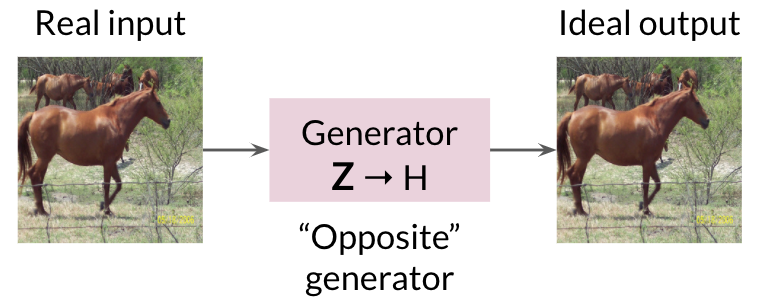

In [19]:
def get_identity_loss(real_X, gen_YX, identity_criterion):
    '''
    Return the identity loss of the generator given inputs
    (and the generated images for testing purposes).
    Parameters:
        real_X: the real images from pile X
        gen_YX: the generator for class Y to X; takes images and returns the images
            transformed to class X
        identity_criterion: the identity loss function; takes the real images from X and
                        those images put through a Y->X generator and returns the identity
                        loss (which you aim to minimize)
    '''
    identity_X = gen_YX(real_X)
    identity_loss = identity_criterion(real_X, identity_X)
    return identity_loss, identity_X

#### Cycle Consistency Loss
This is used to ensure that when you put an image through one generator, that if it is then transformed back into the input class using the opposite generator, the image is the same as the original input image.

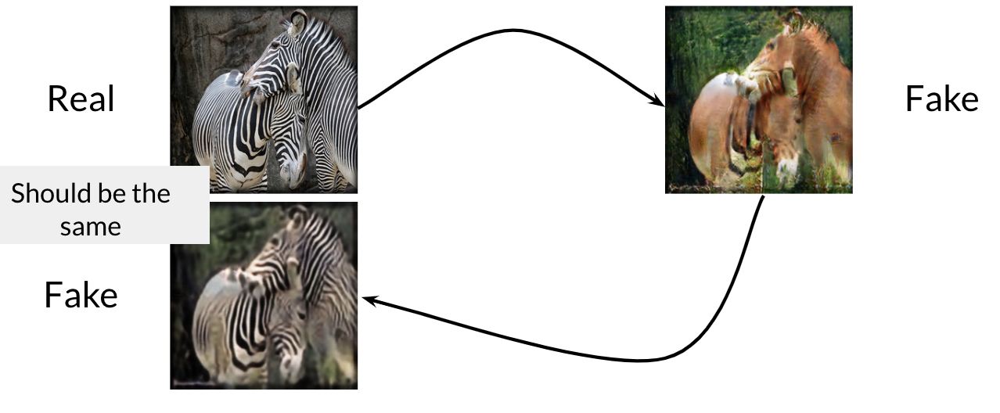

Since you've already generated a fake image for the adversarial part, you can pass that fake image back to produce a full cycle—this loss will encourage the cycle to preserve as much information as possible.


In [20]:
def get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion):
    '''
    Return the cycle consistency loss of the generator given inputs
    (and the generated images for testing purposes).
    Parameters:
        real_X: the real images from pile X
        fake_Y: the generated images of class Y
        gen_YX: the generator for class Y to X; takes images and returns the images
            transformed to class X
        cycle_criterion: the cycle consistency loss function; takes the real images from X and
                        those images put through a X->Y generator and then Y->X generator
                        and returns the cycle consistency loss (which you aim to minimize)
    '''
    cycle_X = gen_YX(fake_Y)
    cycle_loss = cycle_criterion(real_X, cycle_X)
    return cycle_loss, cycle_X

#### Generator Loss (Total)

Finally, you can put it all together!

In [21]:
def get_gen_loss(real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, identity_criterion, cycle_criterion, lambda_identity=0.1, lambda_cycle=10):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        real_A: the real images from pile A
        real_B: the real images from pile B
        gen_AB: the generator for class A to B; takes images and returns the images
            transformed to class B
        gen_BA: the generator for class B to A; takes images and returns the images
            transformed to class A
        disc_A: the discriminator for class A; takes images and returns real/fake class A
            prediction matrices
        disc_B: the discriminator for class B; takes images and returns real/fake class B
            prediction matrices
        adv_criterion: the adversarial loss function; takes the discriminator
            predictions and the true labels and returns a adversarial
            loss (which you aim to minimize)
        identity_criterion: the reconstruction loss function used for identity loss
            and cycle consistency loss; takes two sets of images and returns
            their pixel differences (which you aim to minimize)
        cycle_criterion: the cycle consistency loss function; takes the real images from X and
            those images put through a X->Y generator and then Y->X generator
            and returns the cycle consistency loss (which you aim to minimize).
            Note that in practice, cycle_criterion == identity_criterion == L1 loss
        lambda_identity: the weight of the identity loss
        lambda_cycle: the weight of the cycle-consistency loss
    '''
    # Adversarial Loss -- get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion)
    adv_loss_1 = get_gen_adversarial_loss(real_A, disc_B, gen_AB, adv_criterion)
    adv_loss_2 = get_gen_adversarial_loss(real_B, disc_A, gen_BA, adv_criterion)

    # Identity Loss -- get_identity_loss(real_X, gen_YX, identity_criterion)
    identity_loss_1 = get_identity_loss(real_A, gen_BA, identity_criterion)
    identity_loss_2 = get_identity_loss(real_B, gen_AB, identity_criterion)

    # Cycle-consistency Loss -- get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion)
    fake_B = gen_AB(real_A)
    fake_A = gen_BA(real_B)
    cycle_loss_1 = get_cycle_consistency_loss(real_A, fake_B, gen_BA, cycle_criterion)
    cycle_loss_2 = get_cycle_consistency_loss(real_B, fake_A, gen_AB, cycle_criterion)

    # Total loss
    gen_loss_1 = adv_loss_1[0] + (lambda_identity * identity_loss_1[0]) + (lambda_cycle * cycle_loss_1[0])
    gen_loss_2 = adv_loss_2[0] + (lambda_identity * identity_loss_2[0]) + (lambda_cycle * cycle_loss_2[0])
    gen_loss = gen_loss_1 + gen_loss_2
    return gen_loss, fake_A, fake_B

### CycleGAN Training

We train the model and see some zebras, horses, and some that might not quite look like either!

  0%|          | 0/1067 [00:00<?, ?it/s]

Epoch 0: Step 0: Generator (U-Net) loss: 0.06856117248535157, Discriminator loss: 0.0030238229036331178


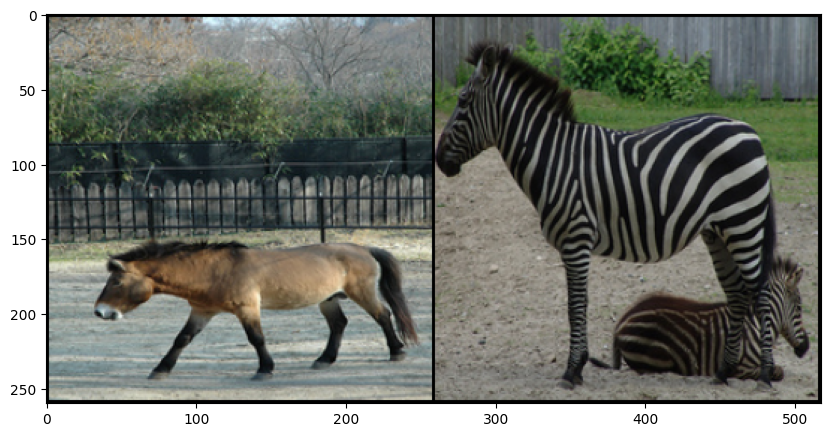

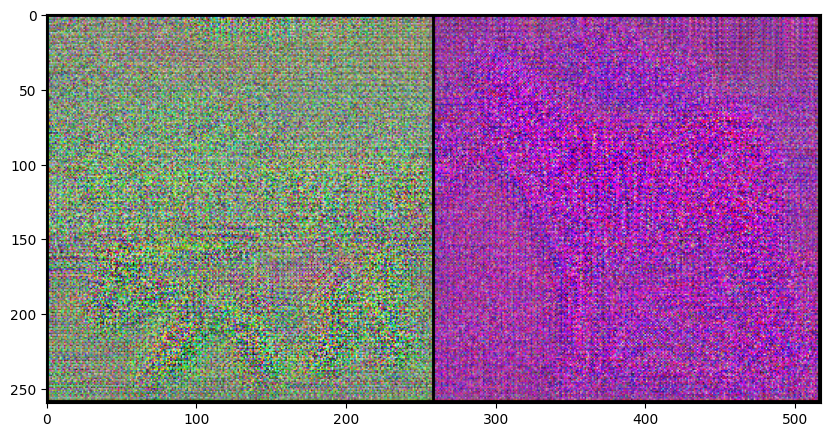

Epoch 0: Step 200: Generator (U-Net) loss: 7.404333484172822, Discriminator loss: 0.24256202995777126


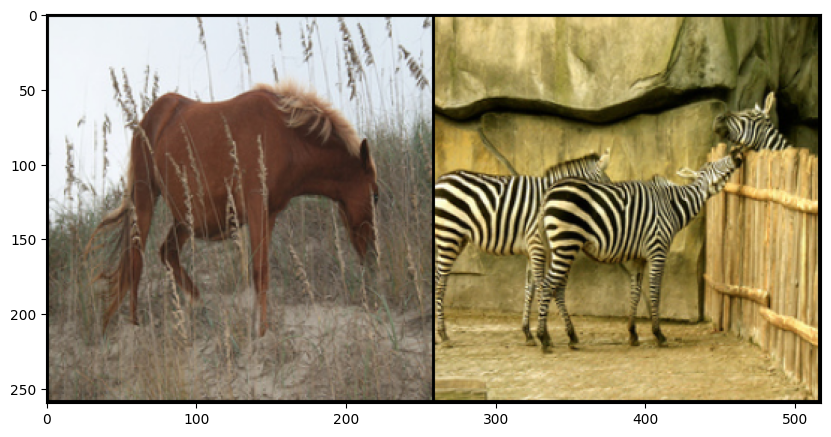

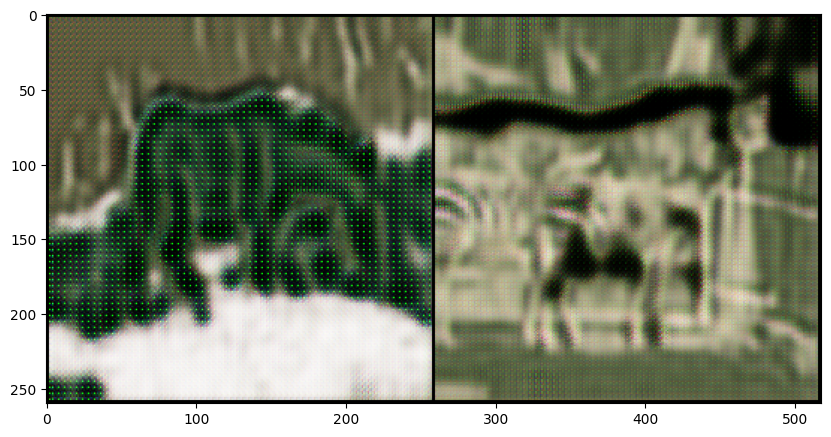

Epoch 0: Step 400: Generator (U-Net) loss: 6.279184689521788, Discriminator loss: 0.2159655771404505


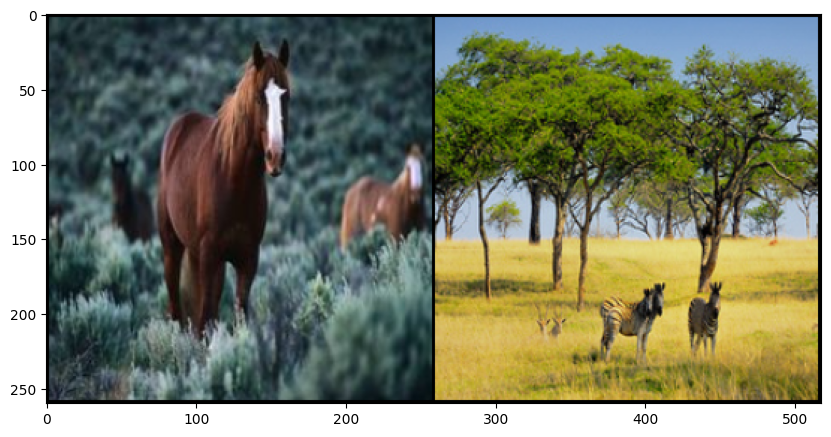

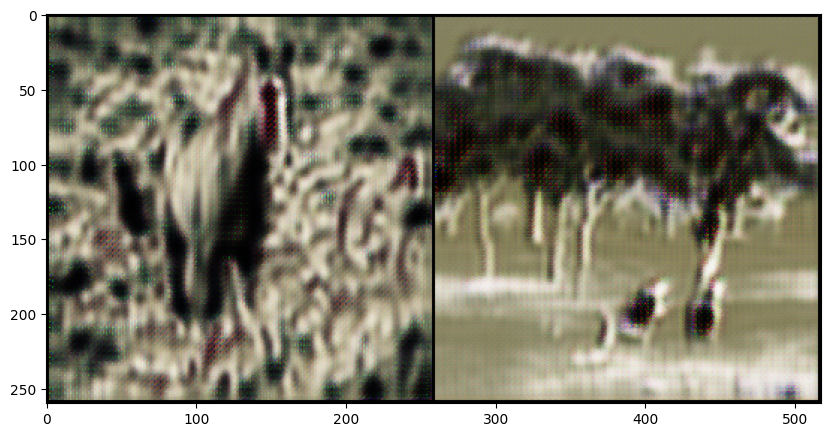

Epoch 0: Step 600: Generator (U-Net) loss: 5.655001995563505, Discriminator loss: 0.22728776991367325


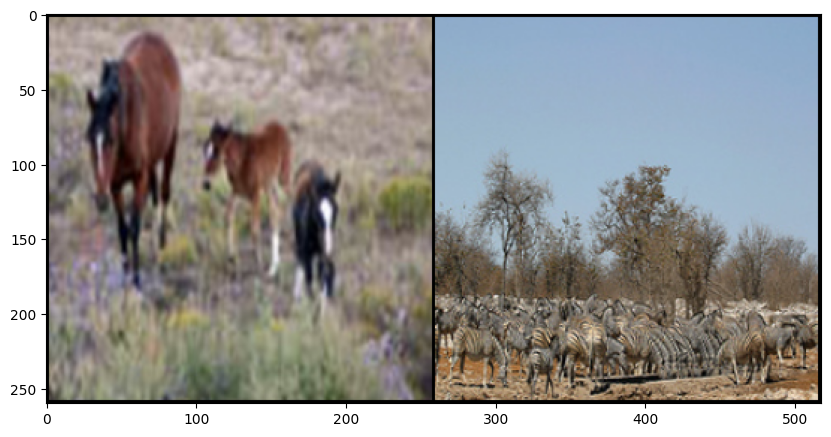

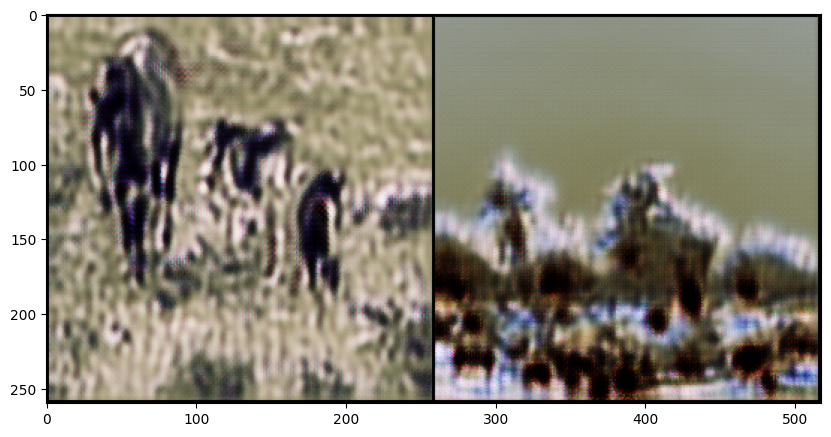

Epoch 0: Step 800: Generator (U-Net) loss: 5.814145016670228, Discriminator loss: 0.23129631109535678


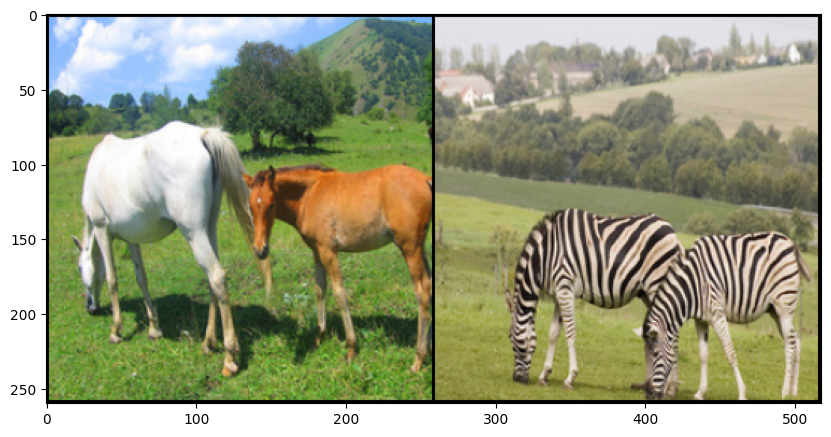

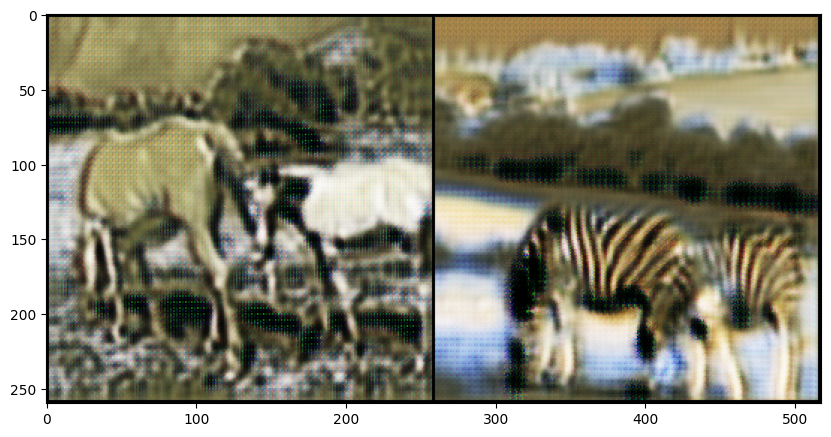

Epoch 0: Step 1000: Generator (U-Net) loss: 5.770610830783843, Discriminator loss: 0.22513619899749743


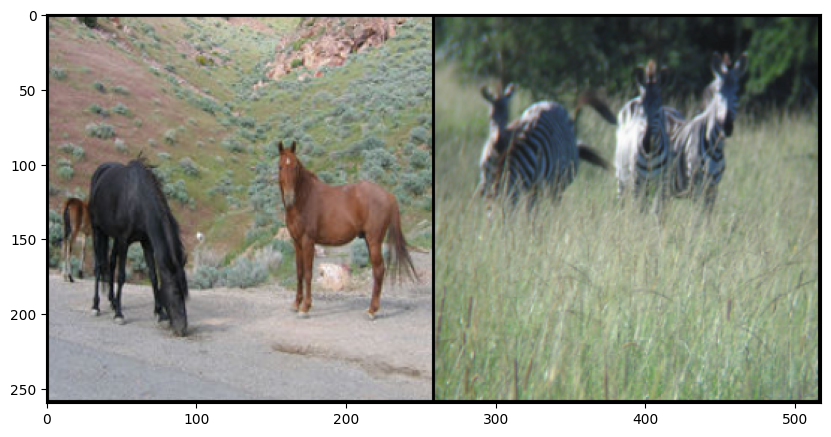

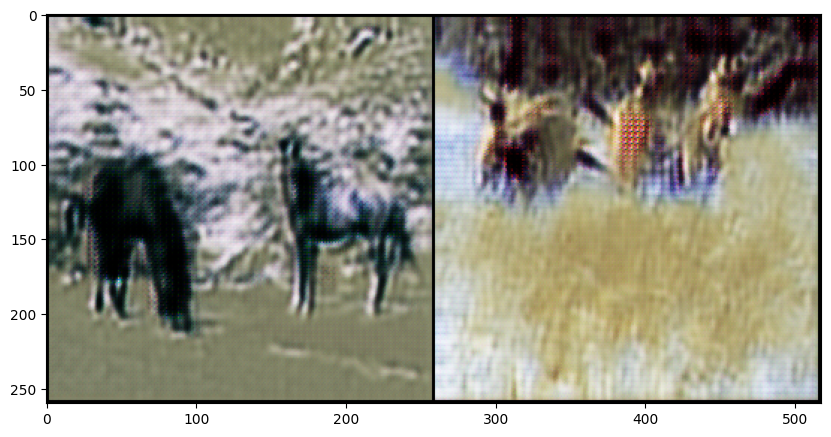

  0%|          | 0/1067 [00:00<?, ?it/s]

Epoch 1: Step 1200: Generator (U-Net) loss: 5.547505451440811, Discriminator loss: 0.21378955628722898


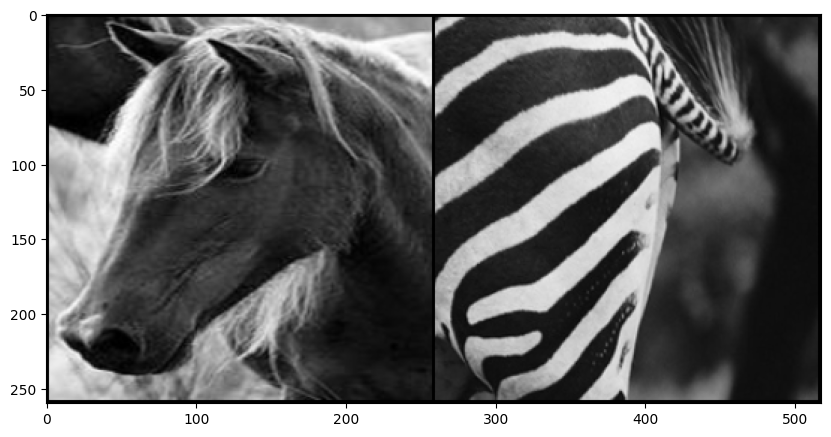

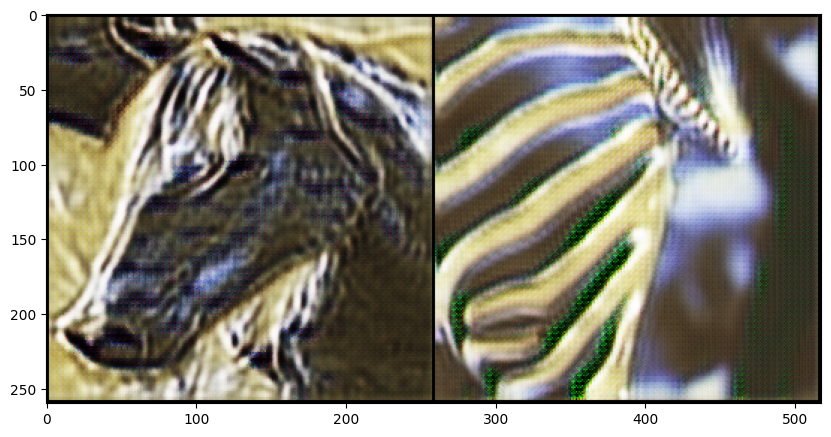

Epoch 1: Step 1400: Generator (U-Net) loss: 5.3316594278812435, Discriminator loss: 0.20673739794641727


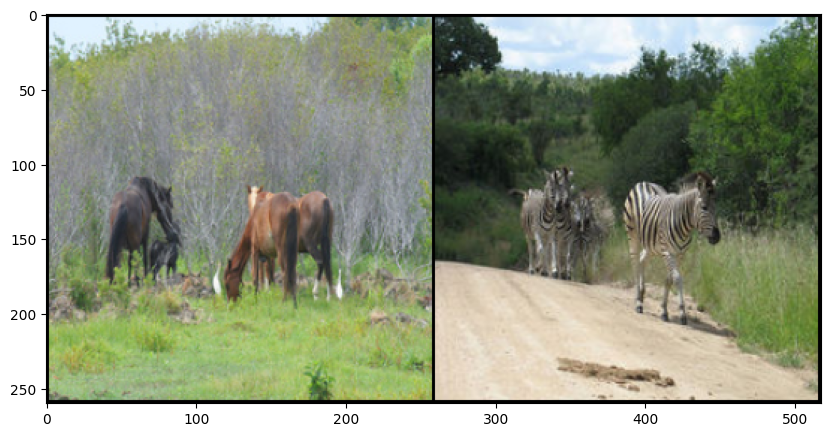

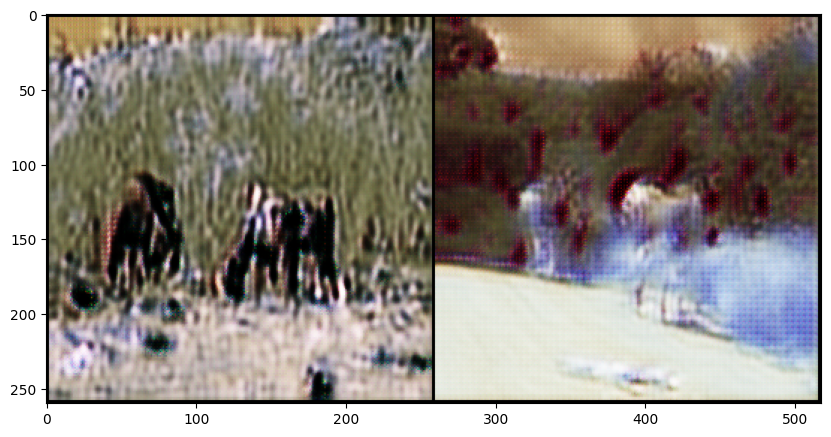

In [ ]:
from skimage import color
import numpy as np
plt.rcParams["figure.figsize"] = (10, 10)


def train(save_model=False):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        # for image, _ in tqdm(dataloader):
        for real_A, real_B in tqdm(dataloader):
            # image_width = image.shape[3]
            real_A = nn.functional.interpolate(real_A, size=target_shape)
            real_B = nn.functional.interpolate(real_B, size=target_shape)
            cur_batch_size = len(real_A)
            real_A = real_A.to(device)
            real_B = real_B.to(device)

            ### Update discriminator A ###
            disc_A_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake_A = gen_BA(real_B)
            disc_A_loss = get_disc_loss(real_A, fake_A, disc_A, adv_criterion)
            disc_A_loss.backward(retain_graph=True) # Update gradients
            disc_A_opt.step() # Update optimizer

            ### Update discriminator B ###
            disc_B_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake_B = gen_AB(real_A)
            disc_B_loss = get_disc_loss(real_B, fake_B, disc_B, adv_criterion)
            disc_B_loss.backward(retain_graph=True) # Update gradients
            disc_B_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss, fake_A, fake_B = get_gen_loss(
                real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, recon_criterion, recon_criterion
            )
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_A_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                show_tensor_images(torch.cat([real_A, real_B]), size=(dim_A, target_shape, target_shape))
                show_tensor_images(torch.cat([fake_B, fake_A]), size=(dim_B, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # You can change save_model to True if you'd like to save the model
                if save_model:
                    torch.save({
                        'gen_AB': gen_AB.state_dict(),
                        'gen_BA': gen_BA.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc_A': disc_A.state_dict(),
                        'disc_A_opt': disc_A_opt.state_dict(),
                        'disc_B': disc_B.state_dict(),
                        'disc_B_opt': disc_B_opt.state_dict()
                    }, f"cycleGAN_{cur_step}.pth")
            cur_step += 1
train()